In [1]:
import os
import random

import torch
import cv2
import torch.nn as nn
import torch.nn.functional as F
import segmentation_models_pytorch as smp
from torchvision.models import resnet34, ResNet34_Weights
from segmentation_models_pytorch import utils as smp_utils
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import Dataset, DataLoader
import cv2
from PIL import Image
import albumentations as album
from albumentations.pytorch import ToTensorV2
from tqdm.notebook import tqdm
from scipy.ndimage import convolve
from skimage.morphology import skeletonize

/opt/conda/lib/python3.12/site-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
data_dir = "roads_dataset_cropped/"
train_img_dir = data_dir + "train"
val_img_dir = data_dir + "val"
test_img_dir = data_dir + "test"

train_label_dir = data_dir + "train_labels"
val_label_dir = data_dir + "val_labels"
test_label_dir = data_dir + "test_labels"
BATCH_SIZE = 8

In [ ]:
class_dict = pd.read_csv(data_dir+"label_class_dict.csv")
class_names = class_dict['name'].tolist()
class_rgb_values = class_dict[['r','g','b']].values.tolist()
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

Class Names:  ['background', 'road']
Class RGB values:  [[0, 0, 0], [255, 255, 255]]


In [4]:
select_class_indices = [class_names.index(cls.lower()) for cls in class_names]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]
select_class_rgb_values

array([[  0,   0,   0],
       [255, 255, 255]])

In [ ]:
def visualize(**images):
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    #plt.savefig('preds.png')
    plt.show()

def colour_code_segmentation(image, label_values):
    colour_codes = np.array(label_values)
    x = colour_codes[image.astype(int)]

    return x

In [6]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv_block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv_block(x)

In [7]:
class UpSampleConcat(nn.Module):  # down sampling is in resnet so only up_sample class
    def __init__(self, in_channels, skip_channels, out_channels):
        super().__init__()
        #skip_channels = out_channels
        self.up_conv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.conv = ConvBlock(out_channels+skip_channels, out_channels)

    def forward(self, x, skip):
        x = self.up_conv(x)
        x = torch.cat([x, skip], dim=1)
        x = self.conv(x)
        return x

In [8]:
class UpSampleAdd(nn.Module):
    def __init__(self, in_channels, skip_channels, out_channels):
        super().__init__()
        #skip_channels = out_channels
        self.up_conv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.conv = ConvBlock(out_channels, out_channels)

    def forward(self, x, skip):
        x = self.up_conv(x)
        x = torch.add(x, skip)
        x = self.conv(x)
        return x

In [ ]:
class UnetModel(nn.Module):
    def __init__(self, n_classes, skip):
        super().__init__()
        resnet = resnet34(weights=ResNet34_Weights.DEFAULT)
        resnet.conv1 = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.input_block = nn.Sequential(
            resnet.conv1,
            resnet.bn1,
            resnet.relu
        )
        self.maxpool = resnet.maxpool
        self.encoder1 = resnet.layer1
        self.encoder2 = resnet.layer2
        self.encoder3 = resnet.layer3
        self.encoder4 = resnet.layer4

        self.bottleneck = nn.Sequential(
            nn.Conv2d(512, 1024, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(1024),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        if (skip == 'add'):
            self.decoder1 = UpSampleAdd(1024, 512, 512)
            self.decoder2 = UpSampleAdd(512, 256, 256)
            self.decoder3 = UpSampleAdd(256, 128, 128)
            self.decoder4 = UpSampleAdd(128, 64, 64)
            self.decoder5 = UpSampleAdd(64, 64, 64)
        if (skip == 'concat'):
            self.decoder1 = UpSampleConcat(1024, 512, 512)
            self.decoder2 = UpSampleConcat(512, 256, 256)
            self.decoder3 = UpSampleConcat(256, 128, 128)
            self.decoder4 = UpSampleConcat(128, 64, 64)
            self.decoder5 = UpSampleConcat(64, 64, 64)

        self.last_layer = nn.Sequential(
            nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=2, stride=2),
            nn.Conv2d(64, n_classes, kernel_size=3, padding=1, bias=False)
        )

    def forward(self, x):
        e1 = self.input_block(x)
        maxe1 = self.maxpool(e1)
        e2 = self.encoder1(maxe1)
        e3 = self.encoder2(e2)
        e4 = self.encoder3(e3)
        e5 = self.encoder4(e4)

        b = self.bottleneck(e5)

        d1 = self.decoder1(b, e5) # stride is 2
        d2 = self.decoder2(d1, e4)
        d3 = self.decoder3(d2, e3)
        d4 = self.decoder4(d3, e2)
        d5 = self.decoder5(d4, e1)
        out = self.last_layer(d5)
        
        return out

In [ ]:
class RoadDataset(Dataset):
    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            class_rgb_values=None, 
            augmentation=None, 
    ):
        
        self.image_paths = [os.path.join(images_dir, image_id) for image_id in sorted(os.listdir(images_dir))]
        self.mask_paths = [os.path.join(masks_dir, image_id) for image_id in sorted(os.listdir(masks_dir))]

        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.to_tensor = ToTensorV2(transpose_mask=True)
    
    def __getitem__(self, i):
        image = np.array(Image.open(self.image_paths[i]).convert("RGB"))
        mask = np.array(Image.open(self.mask_paths[i]).convert("L"))
        has_road = False
        tries = 0

        while not has_road and tries < 36:
            tries += 1
            aug_image, aug_mask = image, mask
    
            if self.augmentation:
                sample = self.augmentation(image=aug_image, mask=aug_mask)
                aug_image, aug_mask = sample['image'], sample['mask']
    
            if np.any(aug_mask > 0):
                has_road = True

        tensors = self.to_tensor(image=aug_image, mask=aug_mask)
        image, mask = tensors['image'], tensors['mask']
        mask = (mask > 0).float().unsqueeze(0)
        image = image.float() / 255.0
        return image, mask
        
    def __len__(self):
        return len(self.image_paths)

In [ ]:
def get_training_augmentation():
    train_transform = [
        album.HorizontalFlip(p=0.5),
        album.VerticalFlip(p=0.5),
        album.RandomRotate90(p=0.5),
        album.RandomBrightnessContrast(p=0.2),
    ]
    return album.Compose(train_transform)

def get_validation_augmentation():   
    test_transform = [
        album.PadIfNeeded(min_height=1536, min_width=1536, border_mode=0),
    ]
    return album.Compose(test_transform)

In [12]:
train_dataset = RoadDataset(
    train_img_dir, train_label_dir, 
    augmentation=get_training_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

valid_dataset = RoadDataset(
    val_img_dir, val_label_dir, 
    augmentation=get_validation_augmentation(), 
    class_rgb_values=select_class_rgb_values,
)

test_dataset = RoadDataset(
    test_img_dir, test_label_dir, 
    augmentation=get_validation_augmentation(), 
    class_rgb_values=select_class_rgb_values,
)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

torch.Size([3, 512, 512])


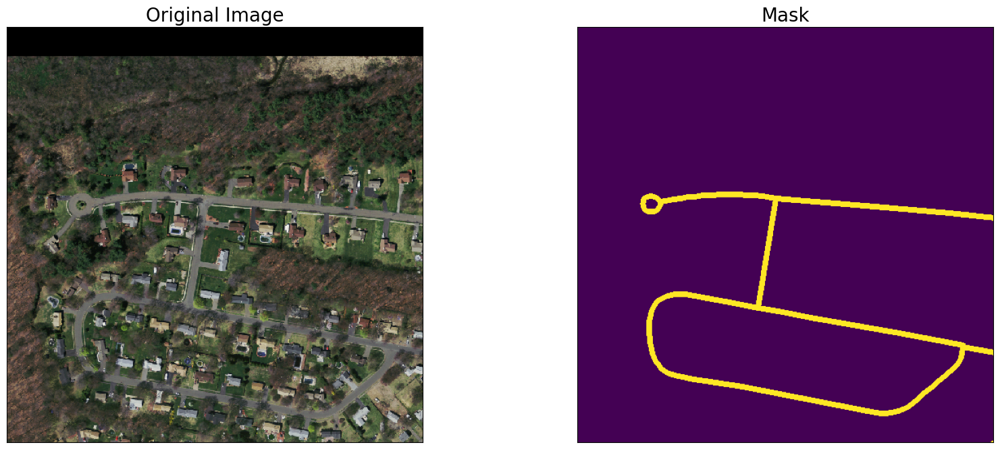

In [ ]:
random_idx = random.randint(0, len(train_dataset)-1)
image, mask = train_dataset[random_idx]
print(image.shape)
visualize(
    original_image = image.permute(1, 2, 0)[:, :, :3],
    mask = mask.squeeze(0).numpy()
)

In [14]:
class DiceBCELoss(nn.Module):
    def __init__(self):
        super(DiceBCELoss, self).__init__()
        self.dice_loss = smp.utils.losses.DiceLoss()
        self.bce_loss = nn.BCEWithLogitsLoss()
        self.__name__ = "DiceBCELoss"

    def forward(self, preds, targets):
        preds_sigmoid = torch.sigmoid(preds)
        #preds_sigmoid = (preds > 0.5).float()
        dice = self.dice_loss(preds_sigmoid, targets)
        bce = self.bce_loss(preds, targets)
        return (dice + bce)/2.0

In [15]:
class GapLoss(nn.Module):
    def __init__(self, k=5):
        super(GapLoss, self).__init__()
        self.k = k
        self.bce_loss = nn.BCEWithLogitsLoss(reduction='none')

    def forward(self, preds, targets):
        B, _, H, W = preds.shape

        if targets.dim() == 4:
            targets = targets.squeeze(1)

        bce_map = self.bce_loss(preds, targets.unsqueeze(1)).squeeze(1)
        prob_maps = torch.sigmoid(preds).squeeze(1).detach().cpu().numpy()

        total_loss = 0.0

        for b in range(B):
            bin_pred = (prob_maps[b] > 0.5).astype(np.uint8)
            skel = skeletonize(bin_pred).astype(np.uint8)

            # endpoint detection
            kernel = np.array([[1, 1, 1],
                               [1, 10, 1],
                               [1, 1, 1]])
            conv = convolve(skel, kernel, mode='constant', cval=0)
            endpoints = (conv == 11).astype(np.uint8)

            # weight map W
            weight = np.ones_like(skel, dtype=np.float32)
            endpoint_neighborhood = convolve(endpoints, np.ones((9, 9)), mode='constant', cval=0)
            weight += (endpoint_neighborhood * (self.k - 1)).astype(np.float32)

            # weighted loss
            weight_tensor = torch.tensor(weight, dtype=torch.float32, device=preds.device)
            ce_tensor = bce_map[b]
            total_loss += torch.mean(weight_tensor * ce_tensor)

        return total_loss / B

In [ ]:
def get_optimizer(model, encoder_lr=1e-4, decoder_lr=1e-3):
    encoder_params = []
    decoder_params = []
    
    for name, param in model.named_parameters():
        if 'encoder' in name:
            encoder_params.append(param)
        else:
            decoder_params.append(param)
    param_groups = [
        {'params': encoder_params, 'lr': encoder_lr},
        {'params': decoder_params, 'lr': decoder_lr}
    ]
    return torch.optim.Adam(params=param_groups, lr=1e-3, weight_decay=0.001)

In [17]:
ENCODER = 'resnet34'
ENCODER_WEIGHTS = 'imagenet'
CLASSES =  ['road']
ACTIVATION = None

model = smp.UnetPlusPlus(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS,
    classes=len(CLASSES), 
    activation=ACTIVATION
)

In [ ]:
EPOCHS = 50
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#loss_fn = DiceBCELoss()
loss_fn = GapLoss(k=5)

#model = UnetModel(n_classes=1, skip='concat')
model = model.to(device)

optimizer = get_optimizer(model)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5)

In [19]:
def iou_score(preds, targets, threshold=0.3, eps=1e-7):
    preds = (preds > threshold).float()
    intersection = (preds * targets).sum()
    union = preds.sum() + targets.sum() - intersection
    return (intersection + eps) / (union + eps)

In [20]:
def dice_coef(preds, targets, threshold=0.3, eps=1e-7):
    preds = (preds > threshold).float()
    intersection = (preds * targets).sum()
    return (2 * intersection + eps) / (preds.sum() + targets.sum() + eps)

In [21]:
best_iou = 0
train_logs, val_logs = [], []

In [22]:
for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0
    train_iou = 0.0
    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1} Train"):
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        #sigmoid_outputs = torch.sigmoid(outputs)
        loss = loss_fn(outputs, masks)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        train_iou += iou_score(torch.sigmoid(outputs), masks)

    model.eval()
    val_loss = 0.0
    val_iou = 0.0
    with torch.no_grad():
        for images, masks in tqdm(val_loader, desc=f"Epoch {epoch+1} Val"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            #sigmoid_outputs = torch.sigmoid(outputs)
            loss = loss_fn(outputs, masks)
            val_loss += loss.item()
            val_iou += iou_score(torch.sigmoid(outputs), masks)

    train_loss /= len(train_loader)
    train_iou /= len(train_loader)
    val_loss /= len(val_loader)
    val_iou /= len(val_loader)

    train_logs.append((train_loss, train_iou))
    val_logs.append((val_loss, val_iou))

    print(f"[Epoch {epoch+1}] Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f} | Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")
    scheduler.step(val_loss)
    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(model.state_dict(), "best_model.pth")
        print("Model saved!")

Epoch 1 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 1 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 1] Train Loss: 0.1655, Train IoU: 0.4870 | Val Loss: 0.1191, Val IoU: 0.5569
Model saved!


Epoch 2 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 2 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 2] Train Loss: 0.1014, Train IoU: 0.5479 | Val Loss: 0.1206, Val IoU: 0.5666
Model saved!


Epoch 3 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 3 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 3] Train Loss: 0.0965, Train IoU: 0.5619 | Val Loss: 0.1069, Val IoU: 0.5744
Model saved!


Epoch 4 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 4 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 4] Train Loss: 0.0931, Train IoU: 0.5713 | Val Loss: 0.1048, Val IoU: 0.5708


Epoch 5 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 5 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 5] Train Loss: 0.0911, Train IoU: 0.5783 | Val Loss: 0.1077, Val IoU: 0.5679


Epoch 6 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 6 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 6] Train Loss: 0.0905, Train IoU: 0.5786 | Val Loss: 0.1031, Val IoU: 0.5927
Model saved!


Epoch 7 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 7 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 7] Train Loss: 0.0895, Train IoU: 0.5825 | Val Loss: 0.1065, Val IoU: 0.5635


Epoch 8 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 8 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 8] Train Loss: 0.0886, Train IoU: 0.5851 | Val Loss: 0.1004, Val IoU: 0.6001
Model saved!


Epoch 9 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 9 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 9] Train Loss: 0.0832, Train IoU: 0.5999 | Val Loss: 0.0946, Val IoU: 0.6102
Model saved!


Epoch 10 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 10 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 10] Train Loss: 0.0822, Train IoU: 0.6039 | Val Loss: 0.0937, Val IoU: 0.6147
Model saved!


Epoch 11 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 11 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 11] Train Loss: 0.0821, Train IoU: 0.6034 | Val Loss: 0.0961, Val IoU: 0.6001


Epoch 12 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 12 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 12] Train Loss: 0.0814, Train IoU: 0.6050 | Val Loss: 0.0961, Val IoU: 0.5975


Epoch 13 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 13 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 13] Train Loss: 0.0810, Train IoU: 0.6059 | Val Loss: 0.0942, Val IoU: 0.5984


Epoch 14 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 14 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 14] Train Loss: 0.0807, Train IoU: 0.6068 | Val Loss: 0.0962, Val IoU: 0.5954


Epoch 15 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 15 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 15] Train Loss: 0.0778, Train IoU: 0.6151 | Val Loss: 0.0895, Val IoU: 0.6228
Model saved!


Epoch 16 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 16 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 16] Train Loss: 0.0772, Train IoU: 0.6163 | Val Loss: 0.0877, Val IoU: 0.6180


Epoch 17 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 17 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 17] Train Loss: 0.0771, Train IoU: 0.6178 | Val Loss: 0.0890, Val IoU: 0.6133


Epoch 18 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 18 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 18] Train Loss: 0.0766, Train IoU: 0.6191 | Val Loss: 0.0911, Val IoU: 0.6028


Epoch 19 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 19 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 19] Train Loss: 0.0763, Train IoU: 0.6195 | Val Loss: 0.0902, Val IoU: 0.6138


Epoch 20 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 20 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 20] Train Loss: 0.0765, Train IoU: 0.6197 | Val Loss: 0.0891, Val IoU: 0.6140


Epoch 21 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 21 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 21] Train Loss: 0.0744, Train IoU: 0.6258 | Val Loss: 0.0884, Val IoU: 0.6121


Epoch 22 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 22 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 22] Train Loss: 0.0740, Train IoU: 0.6273 | Val Loss: 0.0864, Val IoU: 0.6182


Epoch 23 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 23 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 23] Train Loss: 0.0737, Train IoU: 0.6285 | Val Loss: 0.0898, Val IoU: 0.6134


Epoch 24 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 24 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 24] Train Loss: 0.0737, Train IoU: 0.6282 | Val Loss: 0.0875, Val IoU: 0.6253
Model saved!


Epoch 25 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 25 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 25] Train Loss: 0.0735, Train IoU: 0.6289 | Val Loss: 0.0890, Val IoU: 0.6089


Epoch 26 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 26 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 26] Train Loss: 0.0734, Train IoU: 0.6284 | Val Loss: 0.0876, Val IoU: 0.6230


Epoch 27 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 27 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 27] Train Loss: 0.0723, Train IoU: 0.6335 | Val Loss: 0.0869, Val IoU: 0.6245


Epoch 28 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 28 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 28] Train Loss: 0.0719, Train IoU: 0.6346 | Val Loss: 0.0872, Val IoU: 0.6218


Epoch 29 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 29 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 29] Train Loss: 0.0717, Train IoU: 0.6344 | Val Loss: 0.0868, Val IoU: 0.6196


Epoch 30 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 30 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 30] Train Loss: 0.0716, Train IoU: 0.6363 | Val Loss: 0.0870, Val IoU: 0.6181


Epoch 31 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 31 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 31] Train Loss: 0.0715, Train IoU: 0.6361 | Val Loss: 0.0874, Val IoU: 0.6169


Epoch 32 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 32 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 32] Train Loss: 0.0714, Train IoU: 0.6350 | Val Loss: 0.0874, Val IoU: 0.6191


Epoch 33 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 33 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 33] Train Loss: 0.0707, Train IoU: 0.6384 | Val Loss: 0.0862, Val IoU: 0.6220


Epoch 34 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 34 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 34] Train Loss: 0.0706, Train IoU: 0.6387 | Val Loss: 0.0865, Val IoU: 0.6240


Epoch 35 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 35 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 35] Train Loss: 0.0705, Train IoU: 0.6392 | Val Loss: 0.0861, Val IoU: 0.6219


Epoch 36 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 36 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 36] Train Loss: 0.0703, Train IoU: 0.6393 | Val Loss: 0.0872, Val IoU: 0.6216


Epoch 37 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 37 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 37] Train Loss: 0.0703, Train IoU: 0.6396 | Val Loss: 0.0866, Val IoU: 0.6221


Epoch 38 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 38 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 38] Train Loss: 0.0702, Train IoU: 0.6397 | Val Loss: 0.0862, Val IoU: 0.6188


Epoch 39 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 39 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 39] Train Loss: 0.0699, Train IoU: 0.6410 | Val Loss: 0.0868, Val IoU: 0.6208


Epoch 40 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 40 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 40] Train Loss: 0.0699, Train IoU: 0.6412 | Val Loss: 0.0870, Val IoU: 0.6204


Epoch 41 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 41 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 41] Train Loss: 0.0698, Train IoU: 0.6423 | Val Loss: 0.0869, Val IoU: 0.6179


Epoch 42 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 42 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 42] Train Loss: 0.0697, Train IoU: 0.6413 | Val Loss: 0.0863, Val IoU: 0.6212


Epoch 43 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 43 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 43] Train Loss: 0.0698, Train IoU: 0.6423 | Val Loss: 0.0865, Val IoU: 0.6188


Epoch 44 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 44 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 44] Train Loss: 0.0699, Train IoU: 0.6419 | Val Loss: 0.0865, Val IoU: 0.6204


Epoch 45 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 45 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 45] Train Loss: 0.0695, Train IoU: 0.6423 | Val Loss: 0.0864, Val IoU: 0.6228


Epoch 46 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 46 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 46] Train Loss: 0.0695, Train IoU: 0.6433 | Val Loss: 0.0863, Val IoU: 0.6228


Epoch 47 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 47 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 47] Train Loss: 0.0695, Train IoU: 0.6429 | Val Loss: 0.0866, Val IoU: 0.6211


Epoch 48 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 48 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 48] Train Loss: 0.0693, Train IoU: 0.6429 | Val Loss: 0.0869, Val IoU: 0.6191


Epoch 49 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 49 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 49] Train Loss: 0.0694, Train IoU: 0.6432 | Val Loss: 0.0865, Val IoU: 0.6194


Epoch 50 Train:   0%|          | 0/890 [00:00<?, ?it/s]

Epoch 50 Val:   0%|          | 0/14 [00:00<?, ?it/s]

[Epoch 50] Train Loss: 0.0693, Train IoU: 0.6430 | Val Loss: 0.0862, Val IoU: 0.6204


In [34]:
train_losses, train_ious = zip(*train_logs)
val_losses, val_ious = zip(*val_logs)

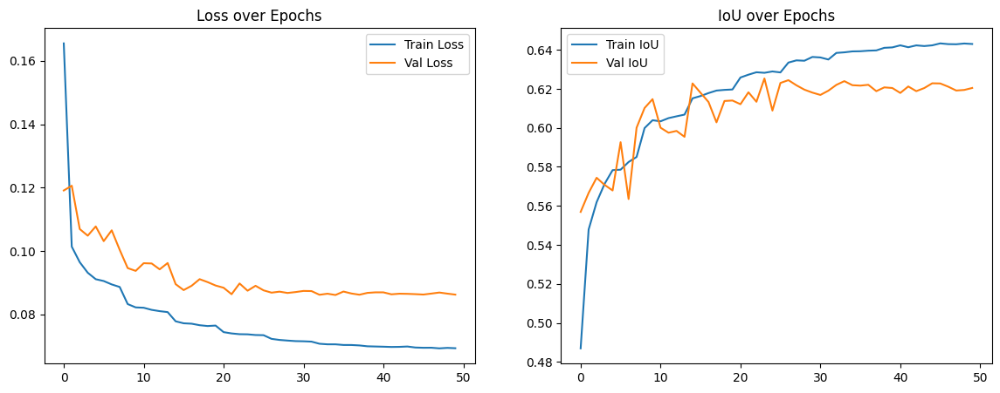

In [35]:
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")
plt.title("Loss over Epochs")
plt.legend()

train_ious = [entry[1].cpu().item() for entry in train_logs]
val_ious = [entry[1].cpu().item() if isinstance(entry[1], torch.Tensor) else entry[1] for entry in val_logs]

plt.subplot(1, 2, 2)
plt.plot(train_ious, label="Train IoU")
plt.plot(val_ious, label="Val IoU")
plt.title("IoU over Epochs")
plt.legend()
#plt.savefig('loss_iou_concat_dice.png')
plt.show()

In [36]:
def visualize_predictions(model, dataloader, device, n_samples=3):
    model.eval()
    for _ in range(n_samples):
        idx = random.randint(0, len(test_dataset) - 1)
        image, mask = test_dataset[idx]

        input_tensor = image.unsqueeze(0).to(device)
        mask_tensor = mask.unsqueeze(0).to(device)

        with torch.no_grad():
            pred = model(input_tensor)
            pred_sigmoid = torch.sigmoid(pred)
            pred = (pred_sigmoid > 0.5).squeeze().cpu().numpy() * 255

        iou = iou_score(pred_sigmoid, mask.to(device))
        image_np = image.permute(1, 2, 0).cpu().numpy() * 255
        image_np = image_np.astype(np.uint8)
        mask_np = mask.squeeze().cpu().numpy() * 255
        mask_np = mask_np.astype(np.uint8)

        print(f"IOU : {iou}")
        visualize(
            original_image=image_np,
            ground_truth_mask=mask_np,
            predicted_mask=pred.astype(np.uint8)
        )

In [39]:
model.load_state_dict(torch.load("best_model.pth"))
model.eval()

UnetPlusPlus(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=Tru

In [40]:
val_iou = 0.0
val_dice = 0.0
with torch.no_grad():
    for images, masks in tqdm(val_loader, desc="Val"):
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        val_iou += iou_score(torch.sigmoid(outputs), masks)
        val_dice += dice_coef(torch.sigmoid(outputs), masks)
val_iou /= len(val_loader)
val_dice /= len(val_loader)
print(f"Val IoU Score: {val_iou:.4f}")
print(f"Val Dice Coefficient: {val_dice:.4f}")

Val:   0%|          | 0/14 [00:00<?, ?it/s]

Val IoU Score: 0.6253
Val Dice Coefficient: 0.7672


IOU : 0.5450359582901001


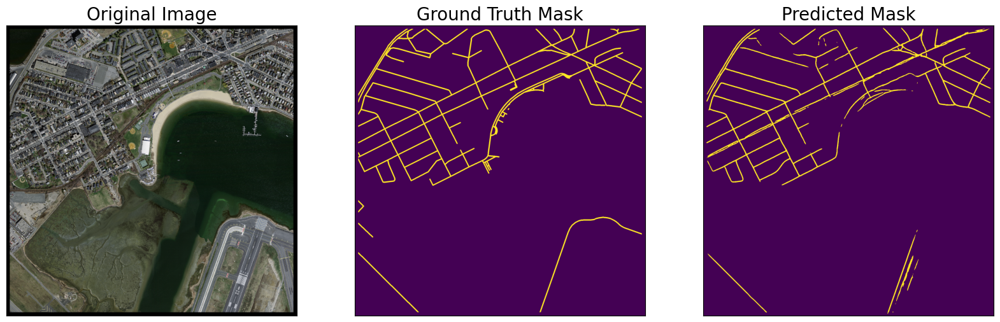

IOU : 0.683124840259552


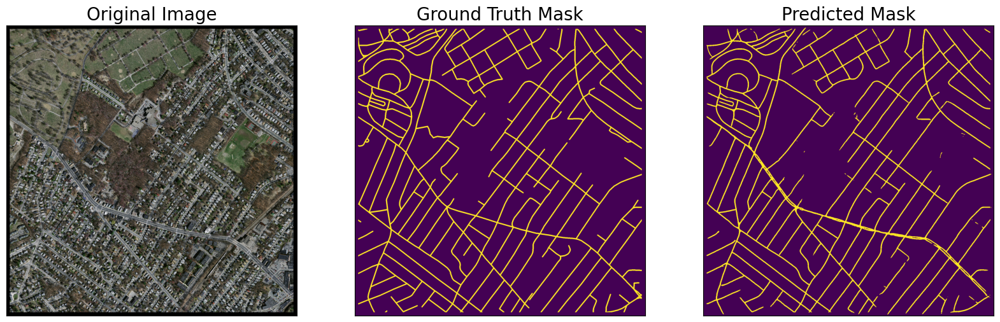

IOU : 0.7213811278343201


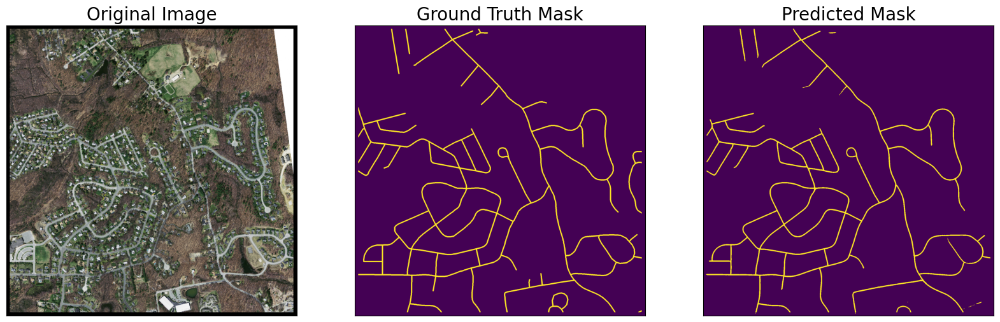

IOU : 0.6060495376586914


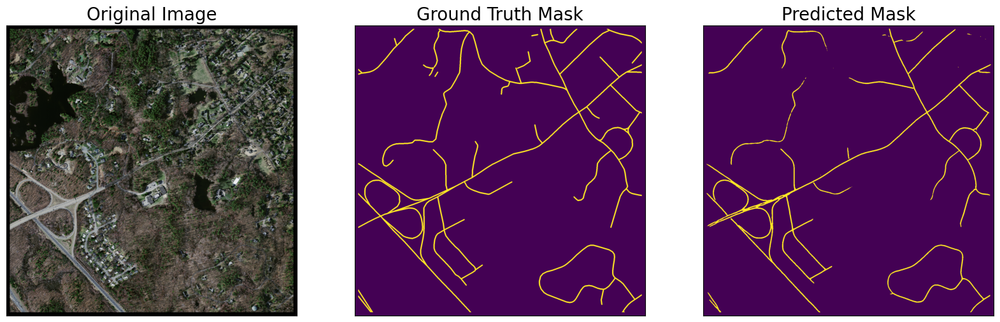

IOU : 0.7659814953804016


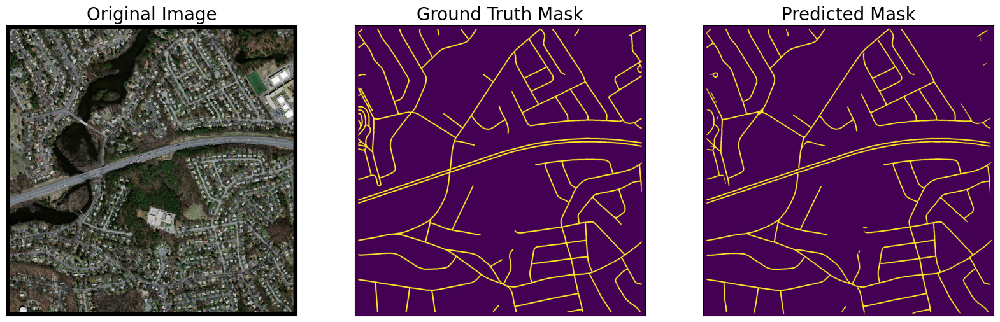

In [41]:
visualize_predictions(
    model=model,
    dataloader=val_loader,
    device=device,
    n_samples=5)

IOU : 0.663456916809082


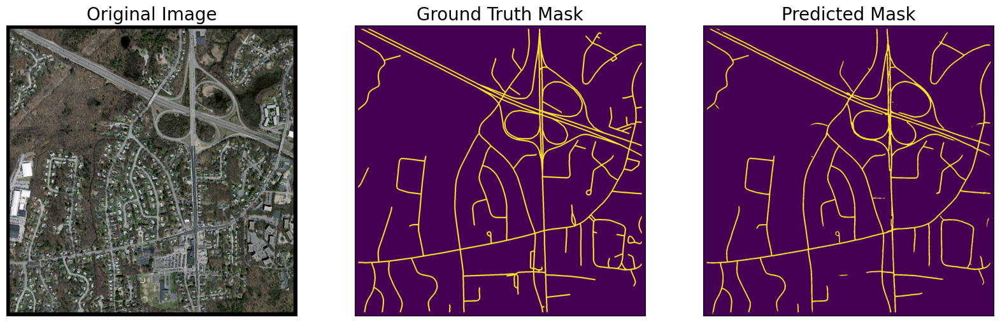

IOU : 0.7087316513061523


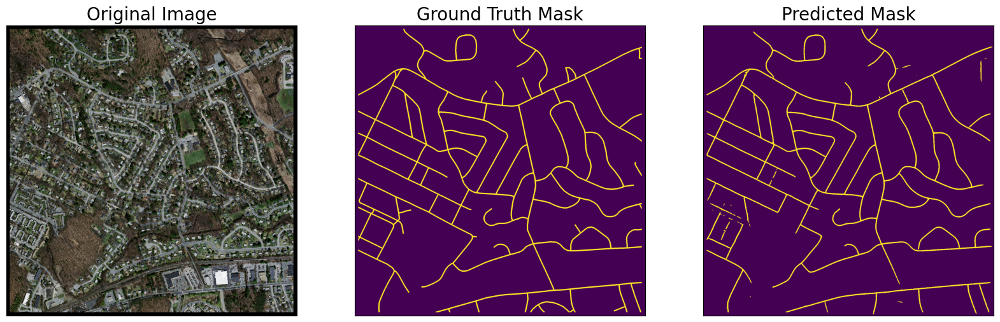

IOU : 0.663456916809082


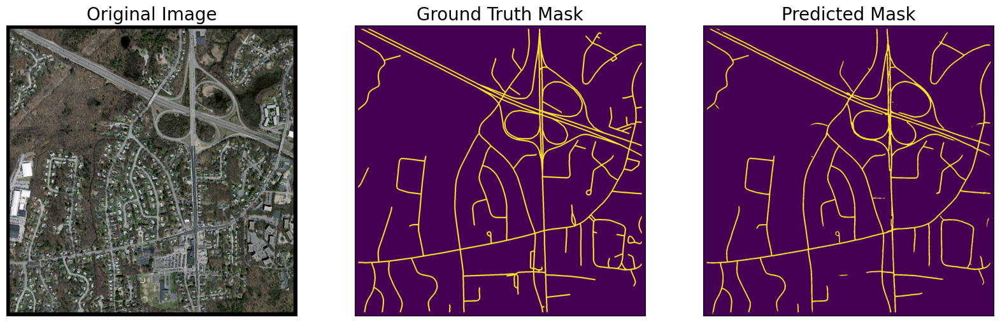

IOU : 0.5849063396453857


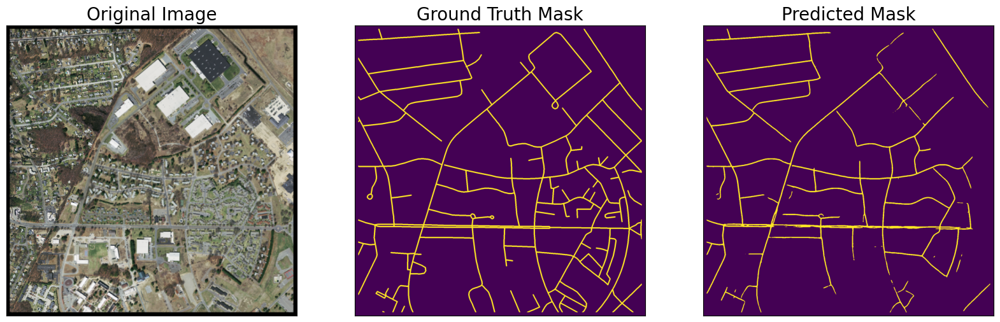

IOU : 0.683124840259552


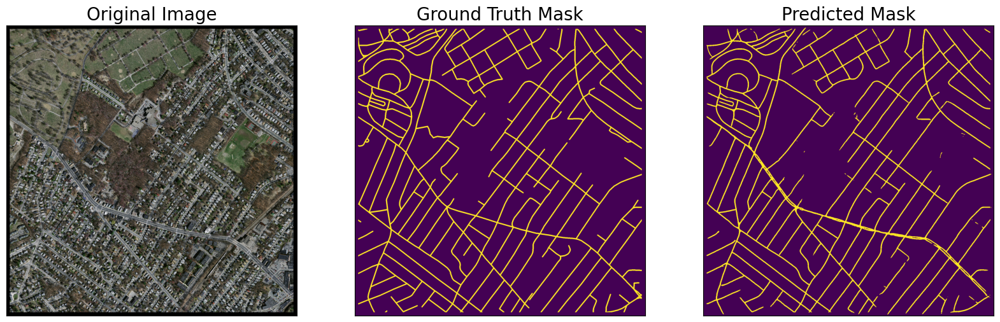

In [51]:
visualize_predictions(
    model=model,
    dataloader=test_loader,
    device=device,
    n_samples=5)

In [43]:
def precision_score(preds, targets, threshold=0.5, eps=1e-7):
    preds = (preds > threshold).float()
    tp = (preds * targets).sum()
    fp = (preds * (1 - targets)).sum()
    return (tp + eps) / (tp + fp + eps)

def recall_score(preds, targets, threshold=0.5, eps=1e-7):
    preds = (preds > threshold).float()
    tp = (preds * targets).sum()
    fn = ((1 - preds) * targets).sum()
    return (tp + eps) / (tp + fn + eps)

In [44]:
def predict_cropped(model, image):
    stride = 512
    output_mask = torch.zeros((1, 1536, 1536), device=device)

    with torch.no_grad():
        idx = 0
        for i in range(0, 1536, stride):
            for j in range(0, 1536, stride):
                patch = image[:, :, i:i+stride, j:j+stride].to(device)
                output = model(patch)  # (1, 1, 512, 512)
                #print(output.shape)
                output = torch.sigmoid(output)
                output = (output > 0.5).float()
                #print(output.squeeze(0).shape)
                output_mask[:, i:i+stride, j:j+stride] = output.squeeze()
                idx += 1
    return output_mask

In [45]:
test_iou = 0.0
test_dice = 0.0
test_precision = 0.0
test_recall = 0.0
with torch.no_grad(): 
    for images, masks in tqdm(test_loader, desc="Test"):
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        #outputs = predict_cropped(model,images)
        #visualize(output=output.squeeze().cpu().detach())
        test_iou += iou_score(torch.sigmoid(outputs), masks)
        test_dice += dice_coef(torch.sigmoid(outputs), masks)
        test_precision += precision_score(torch.sigmoid(outputs), masks)
        test_recall += recall_score(torch.sigmoid(outputs), masks)
test_iou /= len(test_loader)
test_dice /= len(test_loader)
test_precision /= len(test_loader)
test_recall /= len(test_loader)
print(f"Test IoU Score: {test_iou:.2f}")
print(f"Test Dice Coefficient: {test_dice:.2f}")
print(f"Test Precision Score: {test_precision:.4f}")
print(f"Test Recall Score: {test_recall:.4f}")

Test:   0%|          | 0/47 [00:00<?, ?it/s]

Test IoU Score: 0.66
Test Dice Coefficient: 0.79
Test Precision Score: 0.8744
Test Recall Score: 0.6854
